<a href="https://colab.research.google.com/github/joaojf/Airbnb_Data_Analysis_Lisboa/blob/master/Airbnb_Data_Analysis_Lisboa_Portugal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### **Data Science**

---

# Análise dos Dados do Airbnb - *Lisboa*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para tornar essa hospedagem alternativa.

No final de 2018, a Startup fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados do site, para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Neste *notebook*, iremos analisar os dados referentes à cidade Lisboa, e ver quais insights podem ser extraídos a partir de dados brutos.**

![lisboa-portugal](https://loveincorporated.blob.core.windows.net/contentimages/fullsize/3f754252-dd5b-42b7-b6ca-7c9dd0209a92-lisbon-portugal-skyline.jpg)

&nbsp;

Lisboa é capital de um dos países mais antigos do mundo, sendo nomeada (não oficialmente) como tal em 1255. O turismo em Lisboa é uma mistura de beleza, história e comidas maravilhosas; qualidades que levam milhões de turistas para Portugal todos os anos.


Na cidade há paisagens naturais, diversos monumentos que marcam vários acontecimentos históricos mundiais, muita cultura e uma gastronomia única. Isso sem contar a simpatia da população.


Talvez pela ligação histórica com o Brasil, afinal fomos colonizados por portugueses, ou pela semelhança entre as linguagens (só semelhança mesmo), muitos brasileiros resolvem explorar o guia turístico de Portugal e Lisboa 
durante as férias, o que acaba sendo a porta de entrada de um novo mundo.

&nbsp;

---
## Quer saber mais sobre o turismo em Lisboa?


A seguir, uma análise de dados realizada por mim. Aqui você vai encontrar varias informações entre elas estão:


`Qual a média dos preços de aluguel?`

`Qual a localidade mais cara da capital?`

`Qual a localidade mais cara, próxima das principais atrações de Lisboa?`

`Qual quantidade mínima de noites para reserva?`

`Qual o tipo de imóvel mais alugado em Lisboa?`

---
&nbsp;
### Com essa análise fica fácil montar o seu roteiro em Lisboa.


## Obtenção dos Dados


In [66]:
# importar os pacotes necessarios
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from sys import prefix

# visualizar todas linhas e colunas
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

%matplotlib inline

In [67]:
# importar o arquivo listings.csv para um DataFrame
df=pd.read_csv('http://data.insideairbnb.com/portugal/lisbon/lisbon/2021-12-08/visualisations/listings.csv')

Fonte dos Dados: [Airbnb](http://insideairbnb.com/get-the-data.html)

## Análise dos Dados


O objetivo desta etapa é entender a estrutura do conjunto de dados.

**Dicionário das variáveis**

* `id` - Número de id gerado para identificar o imóvel
* `name` - Nome da propriedade anunciada                          
* `host_id` - Número de id do proprietário (anfitrião) da propriedade                          
* `host_name` - Nome do anfitrião                        
* `neighbourhood_group` - Nome do grupo dos bairros (municípios)          
* `neighbourhood` - Nome do bairro                    
* `latitude` - Coordenada da latitude da propriedade                      
* `longitude` - Coordenada da longitude da propriedade                         
* `room_type` - Informa o tipo de quarto que é oferecido                          
* `price` - Preço para alugar o imóvel                               
* `minimum_nights` - Quantidade mínima de noites para reservar                     
* `number_of_reviews` - Número de reviews que a propriedade possui                
* `last_review` - Data do último review                      
* `reviews_per_month` - Quantidade de reviews por mês                 
* `calculated_host_listings_count` - Quantidade de imóveis do mesmo anfitrião    
* `availability_365` - Número de dias de disponibilidade dentro de 365 dias                   
* `number_of_reviews_ltm`(last Twelve months) - Número de reviews nos últimos doze meses               
* `license` - Licenciamento comercial

Um total de 18 variáveis.

Antes de iniciar qualquer análise, vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [68]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,40,3,32,2021-11-01,0.36,1,315,6,NaN
1,25659,Heart of Alfama Lisbon Center - Cœur de l'Alfama,107347,Ellie,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,50,2,127,2021-11-27,1.37,1,325,14,56539/AL.
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,60,5,337,2021-12-03,2.53,1,190,13,23535/AL
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,60,2,299,2021-12-03,2.57,1,302,40,28737/AL
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.71108,-9.15979,Entire home/apt,957,2,64,2021-11-14,0.48,2,248,9,55695/AL


### **Q1. Quantos atributos (variáveis) e quantas entradas o nosso conjunto de dados possui? Quais os tipos das variáveis?**

In [69]:
# identificar o volume de dados do DataFrame
print('Dimensões do Dataset','\nVariáveis:',df.shape[1],'\nEntradas:',df.shape[0],'\n')

# verificar os tipos das variáveis do dataset
df.dtypes

Dimensões do Dataset 
Variáveis: 18 
Entradas: 18527 



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

Com um total de 18 variáveis que representam as colunas do dataset e 18527 entradas que representam as linhas já conseguimos ter uma certeza noção e conhecimento dos dados.

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

In [70]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes
(df.isnull().sum().sort_values(ascending=False) / df.shape[0] * 100)[:6]

reviews_per_month    13.526205
last_review          13.526205
license               9.710153
host_name             0.124143
name                  0.043180
minimum_nights        0.000000
dtype: float64

Aqui temos 5 variáveis com algum valor de entradas ausentes. A variável que contém mais valores ausentes é as `reviews_per_month` com pouco mais de `13.52%` seguida pela `last_review` que por coincidência é o mesmo valor. Aqui não será realizada nenhuma tratativa especifica como excluir as entradas ou as variáveis, pois, julgo que pouco mais de `13%` não seja um valor considerável na análise.

---
Um pouco de reflexão sobre `qualidade` e `redução de dados`.

Dados de qualidade vencem os algoritmos mais sofisticados.

*Redução de dados* tenta pegar um grande conjunto de dados e substituí-lo por um conjunto menor que contém grande parte das informações importantes do conjunto maior. Pode ser mais fácil de lidar com ou processar um conjunto menor de dados. Além do mais, ele pode revelar melhor as informações. A redução de dados geralmente envolve perda de informação. O importante é o equilíbrio para uma melhor compreensão.

### **Q3. Qual o tipo de distribuição das variáveis?** 

Para verificar a distribuição, irei plotar o histograma das variáveis.

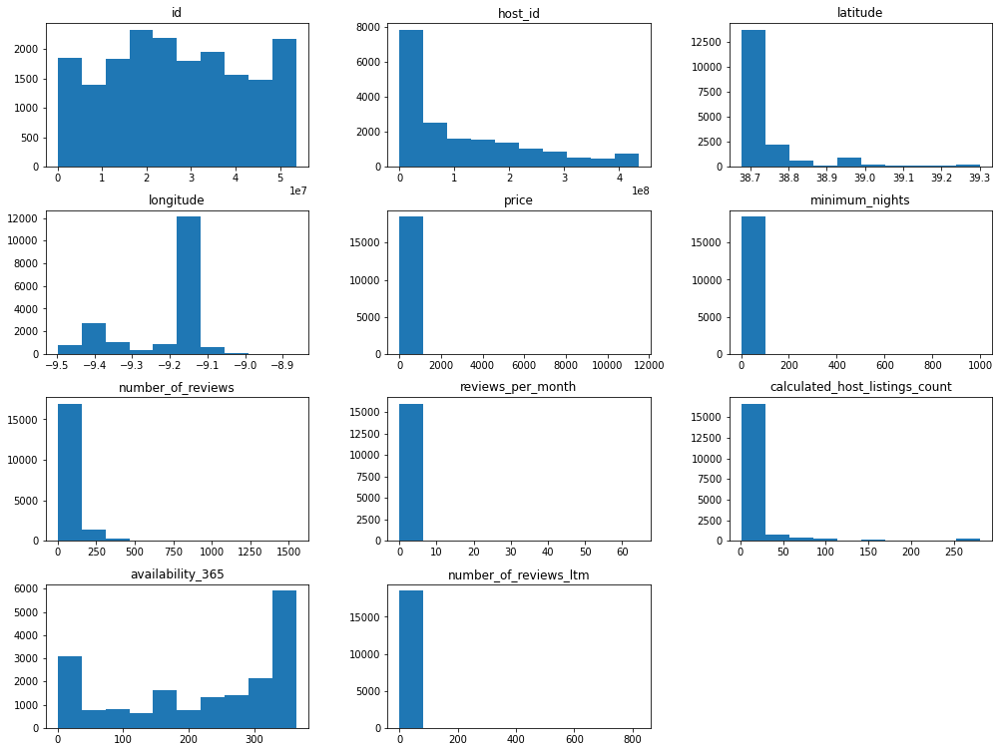

In [71]:
# plotar o histograma das variáveis numéricas
df.hist(figsize=(17,13), grid=False);

Verificando os histogramas, conseguimos ver claramente que temos outliers presentes. Para tratá-los vamos seguir os seguintes passos:

* Definir o Q1 e Q3 para as variáveis que serão limpas.
* Calcular o IQR para as variáveis.
* Definir o limite superior e inferior para cortar os outliers.
* Remover os outliers.


### **Limpando Outliers**

Para tratar dos outliers desse conjunto de dados, iremos analisar a distribuição estatística, plotar boxplots e calcular os limites utilizando a regra do IQR Score.

Primeiramente, vamos lembrar o que é o IQR.

O IQR é calculado subtraindo o Terceiro Quartil (75%) pelo Primeiro Quartil (25%).

# IQR = Q3 - Q1

Vamos dar uma olhada nos nossos dados e ver o que identificamos.

* A função round() é usada para arredondar um DataFrame para um número variável de casas decimais . Esta função oferece a flexibilidade de arredondar colunas diferentes por lugares diferentes.
    * Exemplo: 
        
        `price` sem a função round 98.33686
        
        `price` com a função round(2) 98.34

In [72]:
# verificando a distribuição estatística
df.describe().round(2)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,18527.00,1.852700e+04,18527.00,18527.00,18527.00,18527.00,18527.00,16021.00,18527.00,18527.00,18527.00
mean,26912396.54,1.134389e+08,38.76,-9.21,98.34,4.16,47.96,1.21,14.91,220.63,6.55
std,15351588.91,1.182872e+08,0.11,0.11,199.98,18.36,74.43,1.35,38.82,130.56,12.59
min,6499.00,1.445500e+04,38.68,-9.50,0.00,1.00,0.00,0.01,1.00,0.00,0.00
25%,14751807.00,1.562342e+07,38.71,-9.29,49.00,2.00,3.00,0.29,1.00,106.00,0.00
50%,26149419.00,6.625764e+07,38.72,-9.15,69.00,2.00,16.00,0.82,4.00,262.00,2.00
75%,39646656.00,1.881440e+08,38.74,-9.13,100.00,3.00,61.50,1.75,11.00,341.00,9.00
max,53731212.00,4.351773e+08,39.30,-8.86,11499.00,1000.00,1550.00,64.44,281.00,365.00,821.00


Aqui, algumas coisas já chamam a nossa atenção, como por exemplo:

* A variável `price` tem o mínimo em 0.
* Lembrando que a variável `price` trata do preço da diária dos imóveis em moeda local (EUR), estamos vendo que o Q3 está em 100 euros, mas o máximo está em € 11499 mil euros. Claramente, há outliers por aqui.
* A variável `minimum_nights` tem como seu máximo o valor 1000, sendo que o Q3 está em 3. Claramente temos outliers nessa variável.
* As variáveis `number_of_reviews`, `calculated_host_listings_count` e `availability_365` também podem conter outliers, mas não vamos nos preocupar com elas agora.

In [73]:
# identificando os outliers para a variável price
q1_price = df.price.quantile(.25)
q3_price = df.price.quantile(.75)
IQR_price = q3_price - q1_price
print('IQR da variável price: ', IQR_price)

# definindo os limites                                       
sup_price = q3_price + 1.5 * IQR_price
inf_price = q1_price - 1.5 * IQR_price

print('Limite superior de price: ', sup_price)
print('Limite inferior de price: ', inf_price)


IQR da variável price:  51.0
Limite superior de price:  176.5
Limite inferior de price:  -27.5


Aqui podemos ver que, apesar de não termos outliers na parte inferior, continuamos tendo valores iguais a zero, que precisam ser tratados.

Vamos plotar um boxplot para visualizarmos a diferença feita pela limpeza.

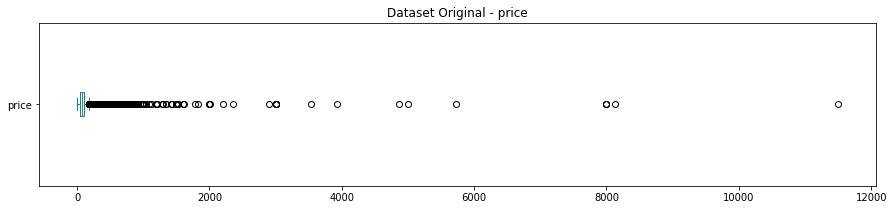

O dataset possui 18527 colunas
1613 Entradas acima de 176.5
Representam 8.71% do dataset


In [74]:
# verificando o conjunto original
fig, ax = plt.subplots(figsize=(15,3))
df.price.plot(kind='box', vert=False);
ax.set_title('Dataset Original - price')
plt.show()
print("O dataset possui {} colunas".format(df.shape[0]))
print("{} Entradas acima de 176.5".format(len(df[df.price > 176.5])))
print("Representam {:.2f}% do dataset".format((len(df[df.price > 176.5]) / df.shape[0])*100))

Nesse boxplot dataset original - price conseguimos ver a quantidade de outliers. Não conseguimos identificar o primeiro quartil e nem terceiro quartil.

Outra informação importante é que acima de 176.5 temos 1613 entradas que vou excluir e que representam `8.71%` do dataset, uma porcentagem confortavél para excluir. 

In [75]:
# identificando os outliers para a variável minimum_nights
q1_minimum_nights = df.minimum_nights.quantile(.25)
q3_minimum_nights = df.minimum_nights.quantile(.75)
IQR_minimum_nights = q3_minimum_nights - q1_minimum_nights
print('IQR da variável minimum_nights: ', IQR_minimum_nights)

# definindo os limites                                       
sup_minimum_nights = q3_minimum_nights + 1.5 * IQR_minimum_nights
inf_minimum_nights = q1_minimum_nights - 1.5 * IQR_minimum_nights

print('Limite superior de minimum_nights: ', sup_minimum_nights)
print('Limite inferior de minimum_nights: ', inf_minimum_nights)

IQR da variável minimum_nights:  1.0
Limite superior de minimum_nights:  4.5
Limite inferior de minimum_nights:  0.5


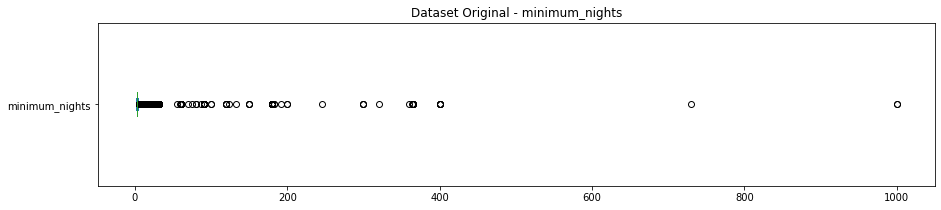

O dataset possui 18527 colunas
2231 Entradas acima de 176.5
Representam 12.04% do dataset


In [76]:
# verificando o conjunto original
fig, ax = plt.subplots(figsize=(15,3))
df.minimum_nights.plot(kind='box', vert=False);
ax.set_title('Dataset Original - minimum_nights')
plt.show()
print("O dataset possui {} colunas".format(df.shape[0]))
print("{} Entradas acima de 176.5".format(len(df[df.minimum_nights > 4.5])))
print("Representam {:.2f}% do dataset".format((len(df[df.minimum_nights > 4.5]) / df.shape[0])*100))

Nesse boxplot dataset original - minimum_nights também conseguimos ver a quantidade de outliers. De novo não conseguimos identificar o primeiro quartil e nem terceiro quartil.

Aqui conseguimos ver que acima de 176.5 temos 2231 entradas que vou excluir e que representam `12.04%` do dataset, uma porcentagem confortavél para excluir. 

In [77]:
# limpando o dataset
df_clean = df.copy()

df_clean.drop(df_clean[df_clean.price > 176.5].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.price == 0.0].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.minimum_nights > 4.5].index, axis=0, inplace=True)

print('Shape antes da limpeza: ', df.shape)
print('Shape após a limpeza: ',df_clean.shape)

Shape antes da limpeza:  (18527, 18)
Shape após a limpeza:  (14971, 18)


Foram removidas 3556 entradas.

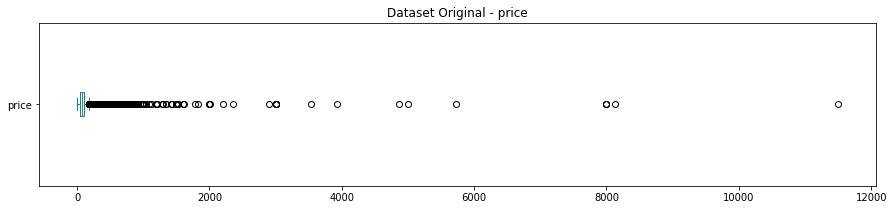

O dataset possui 18527 colunas
1613 Entradas acima de 176.5
Representam 8.71% do dataset


In [78]:
# plotando novamente o boxplot original
fig, ax = plt.subplots(figsize=(15,3))
df.price.plot(kind='box', vert=False);
ax.set_title('Dataset Original - price')
plt.show()
print("O dataset possui {} colunas".format(df.shape[0]))
print("{} Entradas acima de 176.5".format(len(df[df.price > 176.5])))
print("Representam {:.2f}% do dataset".format((len(df[df.price > 176.5]) / df.shape[0])*100))


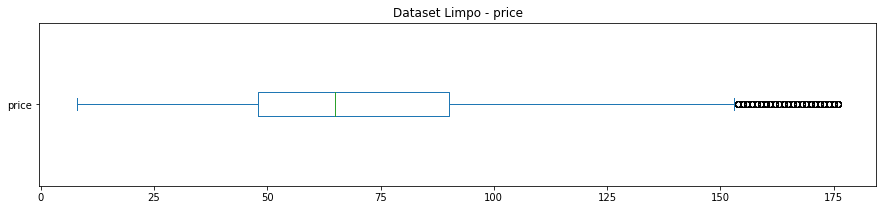

Tamanho original: 18527 colunas
Tamanho atual: 14971 colunas


In [79]:
# verificando o conjunto limpo
fig, ax = plt.subplots(figsize=(15,3))
df_clean.price.plot(kind='box', vert=False);
ax.set_title('Dataset Limpo - price')
plt.show()
print("Tamanho original: {} colunas".format(df.shape[0]))
print("Tamanho atual: {} colunas".format(df_clean.shape[0]))

Podemos observar que agora com o dataset limpo - price já conseguimos identificar o primeiro quartil e o terceiro quartil.

Talvez esteja se perguntando, e aqueles outliers no final do boxplot a partir do 150. É importante lembrar do contexto original, aqui já fizemos a limpeza dos outliers usando o dataset completo.

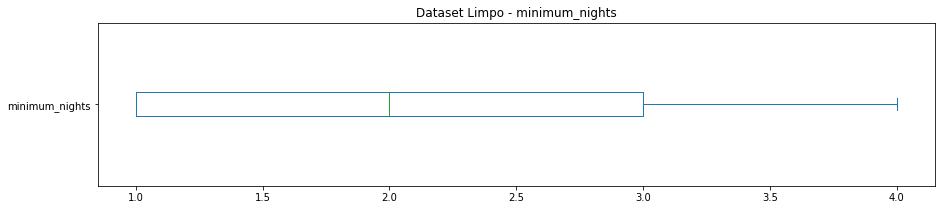

Tamanho original: 18527 colunas
Tamanho atual: 14971 colunas


In [80]:
# verificando o conjunto limpo
fig, ax = plt.subplots(figsize=(15,3))
df_clean.minimum_nights.plot(kind='box', vert=False);
ax.set_title('Dataset Limpo - minimum_nights')
plt.show()
print("Tamanho original: {} colunas".format(df.shape[0]))
print("Tamanho atual: {} colunas".format(df_clean.shape[0]))

Aqui podemos ver o resultado da limpeza.

O boxplot mostra alguns dados como outliers, entretanto, esses estão sendo calculados em relação ao novo dataset, e nossa limpeza levou em consideração os quartis do dado original.

Para garantirmos que não estamos lidando com outliers que vão prejudicar nossa análise, vamos checar os histogramas novamente.


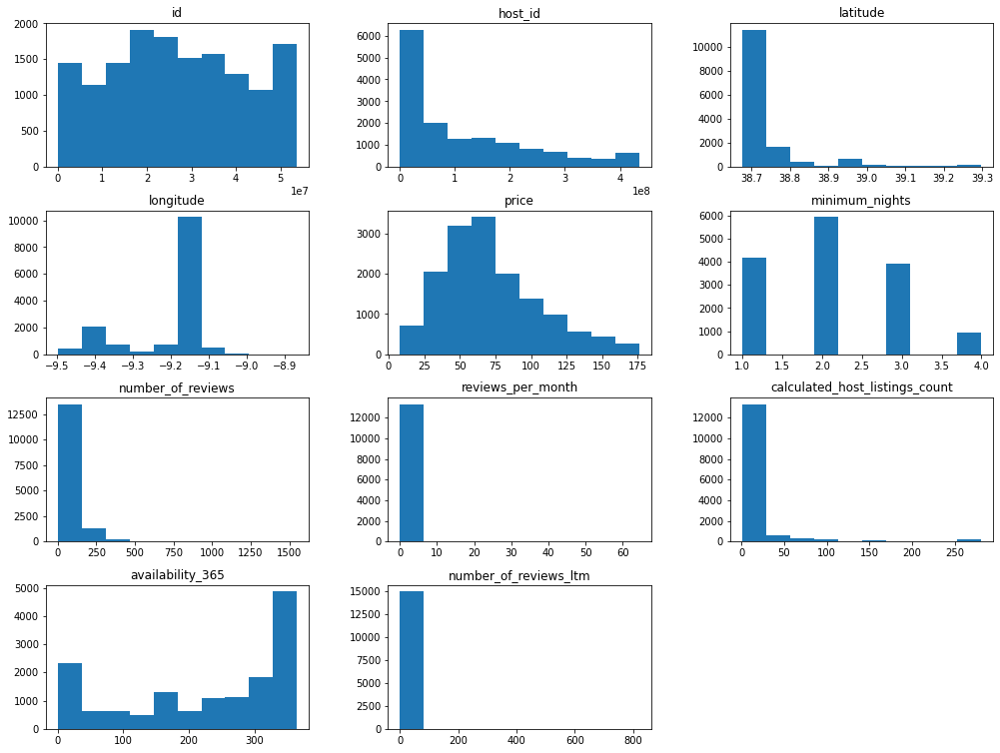

In [81]:
# verificando as distribuições
df_clean.hist(figsize=(17,13), grid=False);

Agora estamos com dados que se aproximam da realidade, não tem dados discrepantes, não tem dados faltantes. O preço minímo está acima de zero oque condiz com a realidade.
Com os dados limpos, finalmente é possível extrair melhor as informações valiosas para quem quer conhecer Lisboa. A seguir, farei algumas perguntas aos dados com este objetivo.

In [82]:
# verificando a distribuição estatística dos dados limpos
df_clean.describe().round(2)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,14971.00,1.497100e+04,14971.00,14971.00,14971.00,14971.00,14971.00,13340.00,14971.00,14971.00,14971.00
mean,26839961.84,1.146083e+08,38.76,-9.20,71.58,2.11,53.72,1.32,16.43,224.41,7.55
std,15205256.78,1.189172e+08,0.11,0.11,34.01,0.88,78.85,1.42,41.91,128.95,13.67
min,6499.00,1.445500e+04,38.68,-9.50,8.00,1.00,0.00,0.01,1.00,0.00,0.00
25%,14965143.00,1.562646e+07,38.71,-9.20,48.00,1.00,4.00,0.34,1.00,124.00,0.00
50%,26108304.00,6.923768e+07,38.72,-9.15,65.00,2.00,21.00,0.94,4.00,268.00,3.00
75%,39192735.50,1.890802e+08,38.74,-9.13,90.00,3.00,72.00,1.92,12.00,341.00,11.00
max,53731212.00,4.351773e+08,39.30,-8.87,176.00,4.00,1550.00,64.44,281.00,365.00,821.00


 Agora conseguimos ter uma ideia bem melhor da distribuição dos nossos dados.

Alguns destaques:

* A mediana da variável `price` foi pouquíssimo afetada pela limpeza dos outliers, mostrando mais uma vez a robustez desse atributo como solução para dados ausentes.
* Agora, temos dados que respeitam as regras definidas no início do notebook, onde vimos o que são bons dados.
* A média da variável `price` foi reduzida drásticamente, enfatizando a sensibilidade desse atributo em relação aos outliers.

### **Q4. Qual a média dos preços de aluguel?**

In [83]:
# ver a média da coluna `price``
print('A média dos preços de aluguel em euro é € {:.2f} euros.'.format(df_clean.price.mean()))
print('A média dos preços de aluguel em real é R$ {:.2f} reais.'.format(df_clean.price.mean() * 6.21))


A média dos preços de aluguel em euro é € 71.58 euros.
A média dos preços de aluguel em real é R$ 444.53 reais.


O preço médio para se hospedar em Lisboa é de € 71.58 euros(R 444.53), em uma
estadia de 1 semana, você terá que desembolsar € 501.08 euros(R 3111.73).

### **Q4. Qual a correlação existente entre as variáveis**

In [84]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].corr()
    
# mostrar a matriz de correlação
display(corr)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
price,1.000000,0.122618,-0.109180,-0.114600,0.101436,0.093137
minimum_nights,0.122618,1.000000,0.051553,-0.080663,-0.077207,-0.078414
number_of_reviews,-0.109180,0.051553,1.000000,0.701529,-0.108977,-0.005006
reviews_per_month,-0.114600,-0.080663,0.701529,1.000000,-0.072330,0.046157
calculated_host_listings_count,0.101436,-0.077207,-0.108977,-0.072330,1.000000,0.070202
availability_365,0.093137,-0.078414,-0.005006,0.046157,0.070202,1.000000


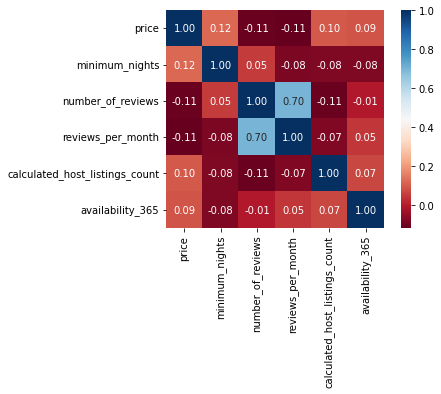

In [85]:
# plotar um heatmap a partir das correlações
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

### **Q5. Qual o tipo de imóvel mais alugado no Airbnb?**

In [86]:
# mostrar a quantidade de cada tipo de imóvel disponível
df_clean.room_type.value_counts()

Entire home/apt    11227
Private room        3231
Hotel room           264
Shared room          249
Name: room_type, dtype: int64

O Airbnb disponibiliza 4 tipos de locação de imóvel, elas são, `casa/apartamento inteiro`, `quarto privado`, `quarto de hotel`, `quarto compartilhado´.

In [87]:
# mostrar a porcentagem de cada tipo de imóvel disponível
(df_clean.room_type.value_counts() / df_clean.shape[0] * 100).round(2)

Entire home/apt    74.99
Private room       21.58
Hotel room          1.76
Shared room         1.66
Name: room_type, dtype: float64

A maioria das pessoas opta por alugar uma `casa ou apartamento inteiro`, equivalente a `74.99%` dos imóveis do dataset. O segundo tipo de imóvel mais alugado é o `quarto privado`, o que equivale a `21.58%` e em seguida, `quarto de hotel` `1.76%` e `quarto compartilhado` `1.66%`.

### **Q6. Qual a localidade mais cara do dataset?**



In [88]:
# ver preços por bairros, na média
(df_clean.groupby('neighbourhood')).price.mean().sort_values(ascending=False)[:10].round(2)

neighbourhood
Arranh                    150.00
Turcifal                  123.75
Meca                      119.00
Dois Portos e Runa        117.50
Peral                     112.25
Maxial e Monte Redondo    107.67
Vilar                      98.50
Parque das Naes            93.31
Sobral de Monte Agrao      90.00
Alcoentre                  90.00
Name: price, dtype: float64

Um ponto interessante sobre a localidade mais cara do dataset `Arranh`. Ela não fica próxima das `principais atrações` de `Lisboa` como restaurantes, mirantes, museus, parques, feiras, lojas entre várias outros.

**Porque esse preço sendo que não é próxima das principais atrações de Lisboa?**

Verificando descobri que as hospedagens oferece 2 quartos, 4 camas, hospeda 5 pessoas, sala e cozinha 2 banheiros, hall e dois parques infantis, 2000m2 de terreno e uma zona de jardim e relva. Tem garagem. Perto de Lisboa (35Km).

Analisando os dados, perceberam que hospedagens com valores mais altos tem algumas `características` comuns, são casas de campo perto de Lisboa, são maiores e mais afastadas, porém, é possível chegar rápido a Lisboa.

[Country House Near Lisbon](https://www.airbnb.com.br/rooms/2702557?previous_page_section_name=1000&federated_search_id=23c563a0-620c-4997-8879-6db0d2a68981)

In [89]:
# filtro realizado para buscar todos as hospedagens nas 24 freguesias de Lisboa
lisboa=df_clean.loc[df_clean.neighbourhood_group == 'Lisboa']
df_lisboa=pd.DataFrame(lisboa)
print('Dataset:',df_clean.shape[0])
print('Lisboa:',df_lisboa.shape[0])
print('As hospedagens nas 24 freguesias de Lisboa representa um total de {:.2f}% do dataset.'.format(df_lisboa.shape[0] / df_clean.shape[0] * 100))

Dataset: 14971
Lisboa: 10967
As hospedagens nas 24 freguesias de Lisboa representa um total de 73.25% do dataset.


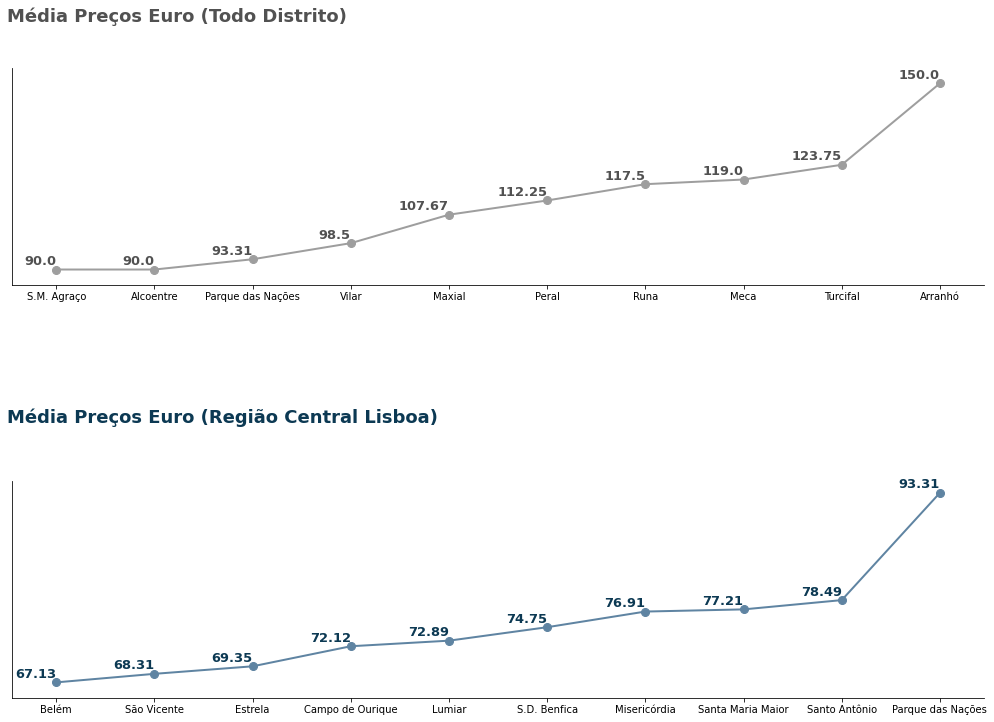

In [90]:
preco_maior=(df_clean.groupby('neighbourhood')).price.mean().sort_values(ascending=True)[-10:].round(2)
preco_menor=(df_lisboa.groupby('neighbourhood')).price.mean().sort_values(ascending=True)[-10:].round(2)

df_preco_maior = pd.DataFrame(preco_maior)
df_preco_menor = pd.DataFrame(preco_menor)

# configurar a fonte
plt.rcParams['font.family'] = 'Arial'

# configurar as cores que usarei no plot
AZUL_CLARO = "#5F84A2"
AZUL_ESCURO = "#0c3953"

CINZA_CLARO = "#9E9E9E"
CINZA_ESCURO = "#515151"

bairros_maior = ['S.M. Agraço','Alcoentre',
                      'Parque das Nações','Vilar','Maxial',
                      'Peral','Runa','Meca','Turcifal','Arranhó']

bairros_menor = ['Belém','São Vicente',
                      'Estrela','Campo de Ourique','Lumiar',
                      'S.D. Benfica','Misericórdia',
                      'Santa Maria Maior','Santo Antônio','Parque das Nações']
print("\n\n\n")

fig, ax = plt.subplots(2,1, figsize=(20,10), dpi=72)

ax[0].plot(df_preco_maior, marker="o", markersize=8, linestyle="-", color=CINZA_CLARO, linewidth=2)
ax[1].plot(df_preco_menor, marker="o", markersize=8, linestyle="-", color=AZUL_CLARO, linewidth=2)

ax[0].set_xticklabels(labels=bairros_maior)
ax[1].set_xticklabels(labels=bairros_menor)

# remover o lado direito da caixa
ax[0].spines['right'].set_visible(False)
ax[1].spines['right'].set_visible(False)

# remover o topo da caixa
ax[0].spines['top'].set_visible(False)
ax[1].spines['top'].set_visible(False)

# escala lateral
ax[0].set_yticks(ticks=range(85,160,10))
ax[1].set_yticks(ticks=range(65,100,5))

# remover lateral ticks e labels
ax[0].set_yticklabels(labels=[], visible=False)
ax[0].set_yticks(ticks=[])

# remover lateral ticks e labels
ax[1].set_yticklabels(labels=[], visible=False)
ax[1].set_yticks(ticks=[])

for i, j in enumerate(df_preco_maior['price']):
    ax[0].annotate(
    j,
    xy=(i+0, j), ha='right', fontsize=13, color=CINZA_ESCURO,
    xytext=(0,5), textcoords='offset pixels', va='baseline',
    fontweight='black'
    )

for i, j in enumerate(df_preco_menor['price']):
    ax[1].annotate(
    j,
    xy=(i+0, j), ha='right', fontsize=13, color=AZUL_ESCURO,
    xytext=(0,5), textcoords='offset pixels', va='baseline',
    fontweight='black'
    )

# titulo
ax[0].text(- 0.5, 170, 'Média Preços Euro (Todo Distrito)', fontsize=18, color=CINZA_ESCURO, fontweight='bold')
ax[1].text(- 0.5, 103, 'Média Preços Euro (Região Central Lisboa)', fontsize=18, color=AZUL_ESCURO, fontweight='bold')

# ajustes do subplot
plt.subplots_adjust(hspace=0.9, right=0.8, top=1.0)

plt.show()

No gráfico podemos observar que a `média de preços` em todo o distrito de Lisboa inicia em `€ 90.00 euros`, em quanto a região central de Lisboa inicia com `€ 67.13 euros`. Isso mostra que é possível se hospedar, próximo das principais atrações pagando um `preço baixo`.

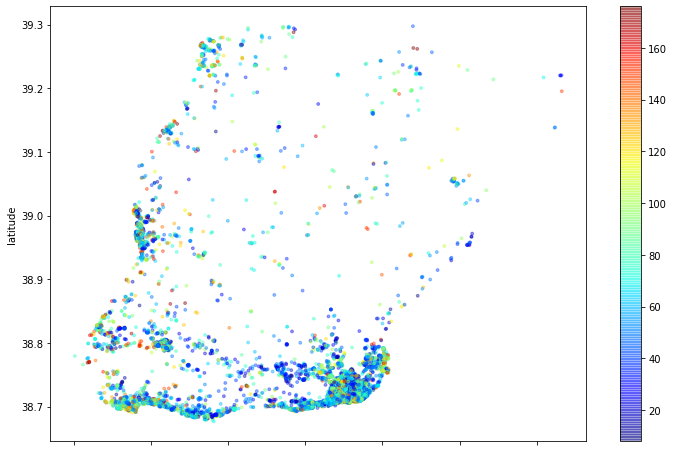

In [91]:
# plotar os imóveis pela latitude-longitude
df_clean.plot(kind="scatter",x='longitude',y='latitude',alpha=0.4,
    c=df_clean['price'], s=8,cmap=plt.get_cmap('jet'), figsize=(12,8));

Vamos verificar qual é a média de preços por bairro no distrito de Lisboa. É importante, termos essa informação, pois, conseguimos uma orientação sobre custo beneficio.

In [92]:
# média de preço dos bairros de Lisboa
(df_lisboa.groupby('neighbourhood')).price.mean().sort_values(ascending=False)[:10].round(2)

neighbourhood
Parque das Naes           93.31
Santo Antnio              78.49
Santa Maria Maior         77.21
Misericrdia               76.91
So Domingos de Benfica    74.75
Lumiar                    72.89
Campo de Ourique          72.12
Estrela                   69.35
So Vicente                68.31
Belm                      67.13
Name: price, dtype: float64

Conseguimos perceber um intervalo considerável entre a média de preços nos principais bairros de Lisboa em relação ao todo.

|Média Preços(Todo Dataset)      |Média Preços(Região Central Lisboa)|
|        :----                   |          :----                    |
|Arranh                 € 150.00 |Parque das Naes          € 93.31   |
|Turcifal               € 123.75 |Santo Antnio             € 78.49   |
|Meca                   € 119.00 |Santa Maria Maior        € 77.21   |
|Dois Portos e Runa     € 117.50 |Misericrdia              € 76.91   |
|Peral                  € 112.25 |So Domingos de Benfica   € 74.75   |
|Maxial e Monte Redondo € 107.67 |Lumiar                   € 72.89   |
|Vilar                  €98.50   |Campo de Ourique         € 72.12   |
|Parque das Naes        € 93.31  |Estrela                  € 69.35   |
|Sobral de Monte Agrao  € 90.00  |So Vicente               € 68.31   |
|Alcoentre              € 90.00  |Belm                     € 67.13   |

Plotando os imóveis na localidade das 24 freguesias de Lisboa conseguimos perceber a concentração nos bairros, Santa Maria Maior e Misericórdia. Regiões essas que ficam próximo das principais atrações de Lisboa.

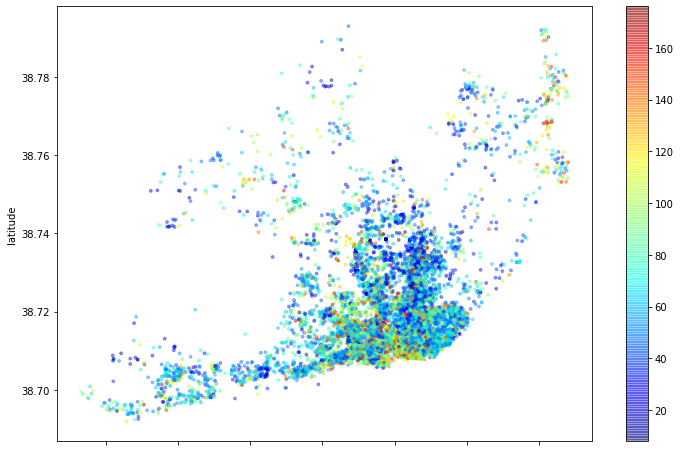

In [93]:
# plotar os imóveis na localidade de Lisboa pela latitude-longitude
df_lisboa.plot(kind="scatter",x='longitude',y='latitude',alpha=0.4,
    c=df_lisboa['price'], s=8,cmap=plt.get_cmap('jet'), figsize=(12,8));

In [94]:
# tratativa realizada para termos disponibilidade maior que 0 dias
df_number_of_reviews=(df_lisboa.loc[df_lisboa['number_of_reviews'] > 0])
df_reviews_per_month=(df_number_of_reviews.loc[df_number_of_reviews['reviews_per_month'] > 0])
df_lisboa_disponiveis=(df_reviews_per_month.loc[df_reviews_per_month['availability_365'] > 0])

Aqui temos um mapa interativo com os preços. Ao clicar consegue visualizar o preço daquela hospedagem.

In [95]:
# imóveis com disponibilidade maior que 0 dias na localidade de Lisboa com os preços informados
precos = []
for i in df_lisboa_disponiveis.price.astype('str'):
    precos.append('Price: € '+i)

locais = df_lisboa_disponiveis[['latitude','longitude']].values.tolist()

m = folium.Map(location=[38.7077507, -9.1365919], zoom_start=10, tiles="OpenStreetMap")

MarkerCluster(locations=locais, popups=precos).add_to(m)

m

In [96]:
# Lisboa: Lugares para visitar em uma viagem à capital de Portugal
# fonte: https://www.melhoresdestinos.com.br/lisboa.html

m = folium.Map(location=[38.7077507,-9.1365919], zoom_start=13, tiles="OpenStreetMap")

folium.Marker(
    location=[38.70752125, -9.136460857083334],
    popup="Praça do Comércio",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7137782,-9.1333843],
    popup="Castelo de S. Jorge",
    icon=folium.Icon(icon="fa-fort-awesome",prefix="fa"),
).add_to(m)

folium.Marker(
    location=[38.7121023,-9.1416262],
    popup="Elevador de Santa Justa",
    icon=folium.Icon(color="gray", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7121407,-9.1424348],
    popup="Convento do Carmo",
    icon=folium.Icon(color="orange", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7098786,-9.1347731],
    popup="Sé de Lisboa",
    icon=folium.Icon(color="", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7148876,-9.1248444],
    popup="Panteão Nacional",
    icon=folium.Icon(color="red", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7149168,-9.1278212],
    popup="Igreja e Mosteiro São Vicente de Fora",
    icon=folium.Icon(color="black", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.71379449194598, -9.139395965267132],
    popup="Praça do Rossio",
    icon=folium.Icon(color="green", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7204499,-9.1454665],
    popup="Av. da Liberdade",
    icon=folium.Icon(color="pink", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7283001,-9.1548715],
    popup="Parque Eduardo VII",
    icon=folium.Icon(color="green", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.71568297183834, -9.123238154867352],
    popup="Feira da Ladra/Mercado de Santa Clara",
    icon=folium.Icon(color="purple", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.69788648082513, -9.207039370374913],
    popup="Mosteiro dos Jerónimos",
    icon=folium.Icon(color="black", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.691613149999995, -9.215917330364086],
    popup="Torre de Belém",
    icon=folium.Icon(icon="fa-fort-awesome",prefix="fa"),
).add_to(m)

folium.Marker(
    location=[38.693605399999996, -9.205700217662642],
    popup="Padrão dos Descobrimentos",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.6957445, -9.1953987],
    popup="MAAT - Tejo Power Station",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.6956474, -9.20931],
    popup="Museu Coleção Berardo",
    icon=folium.Icon(color="red", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7021442, -9.17841241671848],
    popup="LXFactory",
    icon=folium.Icon(color="red", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.763518, -9.093695596111127],
    popup="Oceanário de Lisboa",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7622806, -9.095581811976306],
    popup="Museu Pavilhão do Conhecimento",
    icon=folium.Icon(color="black", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7428859, -9.1721953],
    popup="Teleférico de Lisboa",
    icon=folium.Icon(color="gray", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7086309, -9.141205774426442],
    popup="Museu do Chiado",
    icon=folium.Icon(color="red", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.72479545, -9.11362656501688],
    popup="Museu Nacional do Azulejo",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.71097345, -9.127523648079396],
    popup="Museu do Fado",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7135455, -9.143464632101988],
    popup="Museu e Igreja São Roque",
    icon=folium.Icon(color="purple", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7359143, -9.153252119716395],
    popup="Museu da Fundação Calouste Gulbenkian",
    icon=folium.Icon(color="black", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7090496, -9.1326387],
    popup="Fundação José Saramago ",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7061183, -9.145207494784596],
    popup="Cais do Sodré",
    icon=folium.Icon(color="blue", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7638712, -9.0953729],
    popup="Parque das Nações",
    icon=folium.Icon(color="green", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7123462, -9.1303665],
    popup="Miradouro Portas do Sol",
    icon=folium.Icon(color="red", icon="ok-sign"),
).add_to(m)


folium.Marker(
    location=[38.7191589, -9.132810307036117],
    popup="Miradouro Senhora do Monte",
    icon=folium.Icon(color="green", icon="ok-sign"),
).add_to(m)
# onde comer em lisboa
folium.Marker(
    location=[38.7069935, -9.145693532406336],
    popup="Mercado da Ribeira",
    icon=folium.Icon(color="red", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7203059, -9.1356889],
    popup="Cervejaria Ramiro",
    icon=folium.Icon(color="beige", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7141691, -9.1355896],
    popup="Cantinho do Aziz",
    icon=folium.Icon(color="orange", icon="ok-sign"),
).add_to(m)

folium.Marker(
    location=[38.7122525, -9.1423436],
    popup="Bairro do Avillez",
    icon=folium.Icon(color="purple", icon="ok-sign"),
).add_to(m)

m

Esse mapa tem 34 pontos, entre eles turísticos, restaurantes, mirantes, museus, parques, feiras, lojas entre vários outros. Clicando nos marcadores consegue visualizar o nome dos pontos turísticos dos restaurantes entre os outros pontos.

### **Q7. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [97]:
# ver a média da coluna `minimum_nights``
print('A quantidade mínima de noites para reserva são {:.2f} noites.'.format(df_clean.minimum_nights.mean()))

A quantidade mínima de noites para reserva são 2.11 noites.


A quantidade mínima de noites em um imóvel em Lisboa é a aproximadamente 2 noites, o que pode indicar uma preferência por finais de semanas e partir para outro destino, Portugal tem outras cidades incríveis e Lisboa é uma cidade fantástica para começar a conhecer o país.

##**Parque das Nações a Lisboa Morderna**

O Parque das Nações é um dos **bairros de Lisboa** mais modernos da cidade, e uma atração por si só.

Ele tem seu surgimento ligado a um evento muito tradicional: a **Expo Mundial**. Daí a origem do nome incluir "nações", já que o evento abarca países do mundo todo.

A região era uma zona industrial abandonada e foi revitalizada em 1998 para abrigar o evento.

Após a Expo 1998, ao invés de se desmontar tudo, o local permaneceu com todas as instalações e construções e, atualmente, é uma das zonas turísticas de Lisboa onde modernidade e arte estão bem presentes.

O Parque das Nações é um contraste com a velha (no bom sentido) e tradicional Lisboa com a Lisboa moderna.

Tente visitar o bairro em um dia que o clima em Lisboa esteja bom, pois quase tudo é feito ao ar livre.

![lisboa-portugal](https://stg.construir.pt/app/uploads/2021/07/Parque_das_Nacoes_Lisboa.jpg)

* **O que fazer no Parque das Nações**

 * **Estação do Oriente**

    A região inteira no Parque das Nações foi projetada para ser aprecida e bem utilizada pelo público, portanto, a locomoção é bem fácil.
    
    A chegada ao bairro, na **estação Oriente em Lisboa** (estação de trem, metrô e ônibus no mesmo lugar), já faz parte do roteiro.

    Chamada também de **Gare do Oriente**, ela é uma maravilha da arquitetura moderna e chama atenção de longe com seu formato de arcos estilizados feitos de vidro e aço.

 * **Oceanário**

    O **Oceanário de Lisboa**, que fica dentro do parque, é um dos maiores aquários de toda a Europa, então, já dá pra imaginar a imponência.

 * **Teleférico do Parque das Nações**

    Um meio de transporte criado para facilitar a locomoção na Expo 98, hoje em dia é bem utilizado pelos turistas para conhecer o Parque das Nações.

    São cerca de 1.200 metros percorridos em uma altura de 20 metros por cima do Rio Tejo.

 * **Pavilhão de Portugal**

    Assim como todo o Parque das Nações, o Pavilhão foi projetado para a Expo 98, mas a grandiosidade dele fez com que se tornasse um símbolo de Lisboa.

    A arquitetura conta com um teto que é em um formato que lembra uma grande folha de papel.

    O espaço chegou a ser cogitado para virar museu, mas acabou se tornando parte da Universidade de Lisboa, com um destino ligado à educação, cultura e ciência.

 * **Teatro Camões**
    
    É um espaço cultural muito associado à dança. O Teatro possui uma arquitetura incrível, com a fachada em vidro e de frente para o Rio Tejo.

 * **Pavilhão Atlântico – MEO Arena – Altice Arena**

    Ótimo para festivais, principalmente grandes shows de música, o antigo Pavilhão Atlântico e atualmente Altice Arena é outra das construções imponentes presentes no Parque das Nações.

    O edifício, que nas mudanças de nome também já foi MEO Arena, é de vidro e metal, em um formato que lembra muito uma nave espacial e é um dos maiores espaços fechados dentro do Parque.

 * **Pavilhão do Conhecimento**
    
    Outro dos pavilhões dentro do Parque das Nações que funciona atualmente como um museu interativo.

    Exposições e atividades se mesclam ao museu, que tem como foco a exploração e experimentação da ciência e da tecnologia.

 * **Homem Sol**
    
    Essa atração é na verdade uma grande escultura de ferro. Fica na praça do Parque e é impossível não ser vista de longe.

    A estrutura foi criada pelo artista Jorge Vieira, sendo sua última obra antes de falecer, em 1998.

 * **Rossio dos Olivais**
    
    Você vai passar pelo Rossio dos Olivais durante o passeio pelo Parque das Nações. Isso porque nada mais é do que a grande avenida que liga os prédios até o Rio Tejo.

    O trajeto é pela borda de uma grande piscina “decorada” pelas bandeiras de todos os países que fizeram parte da Expo 98.

 * **Horas de Chumbo**
    
    Outra escultura que chama atenção é a do artista Rui Chafes.

    Horas de Chumbo é uma obra de arte muito interessante em formato de tubos negros, mas que, se olhados de frente, se parecem com dois grandes olhos.

    A obra é interativa e muito usada para tirar fotos. Além disso, a estrutura possibilita fazer experiências com o eco.

 * **Cursiva**
    
    É uma das esculturas do Parque das Nações, criada pela artista estadounidense Amy Yoes.

    De cor verde, a peça são dois grandes “S” cursivos, um maior que o outro, mas de forma espelhada.

 * **Torre Vasco da Gama**
    
    Trata-se do edifício mais alto de Lisboa (140 metros de altura) e lembra muito a famosa torre de Dubai.

    Não é possível “entrar” nela, mas é um ponto marcante na paisagem do Parque das Nações, juntamente com a Ponte Vasco da Gama, que fica logo em frente e é a maior da Europa, com 17,3 km.

 * **Shopping Vasco da Gama**

    E aproveitando que está no bairro, não deixe de visitar um dos melhores shoppings em Lisboa, o Vasco da Gama.

    Ele fica bem em frente à Estação do Oriente e é praticamente passagem obrigatória para chegar às atrações do Parque das Nações.

    Além de compras, também poderá aproveitar para comer na sua praça de alimentação, que tem várias opções de restaurantes e lanchonetes.

## Conclusões


**Conclusões da Análise de Dados**

Esta foi uma análise simples em um conjunto de dados resumido disponibilizado pelo Airbnb na cidade de Lisboa. Nossa análise pode nos ajudar a chegar a algumas conclusões:

* `Qual a média dos preços de aluguel?` O preço médio de um Airbnb em Lisboa é de **€71.58** por noite.

* `Qual a localidade mais cara da capital?` As hospedagens mais caras fica em Arranhó. Analisando os dados, perceberam que hospedagens com valores mais altos tem algumas características comuns, são casas de campo perto de Lisboa, são maiores e mais afastadas.

* `Qual a localidade mais cara, próxima das principais atrações de Lisboa?` Analisando os dados descobri que a localidade mais cara(Arranhó), não fica próxima das principais atrações de Lisboa como restaurantes, mirantes, museus, parques, feiras, lojas entre várias outros. A localidade mais cara próxima a essas atrações é Parque das Nações.

* `Qual quantidade mínima de noites para reserva?` A quantidade mínima de noites para reservar um imóvel em Lisboa é **2,11** noites. Essa quantidade de noites pode indicar uma preferência por finais de semanas por exemplo. 

* `Qual o tipo de imóvel mais alugado em Lisboa?` O tipo de imóvel mais alugado é casa ou apartamento inteiro representando um total de **74.99%** dos imóveis alugados.